In [1]:
import numpy as np
import pandas as pd
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot, plot
init_notebook_mode(connected='true')

# Charging Itineraire Strategy

We need to determine a strategy for charging the battery according to the PV generation profile in order to maximize PV load income for its further use. We focus our attention in the generation profiles.

#### 0. Prepairing data

In [2]:
#loading set
pv_generation = pd.read_csv('./Data/task0/pv_train_set0.csv', parse_dates = True, index_col = 'datetime')
demand = pd.read_csv('./Data/task0/demand_train_set0.csv', parse_dates = True, index_col = 'datetime')

In [3]:
#table preview
pv_generation.head()

,irradiance_Wm-2,pv_power_mw,panel_temp_C
datetime,,,
2017-11-03 00:00:00,0.0,0.0,7.05
2017-11-03 00:30:00,0.0,0.0,7.38
2017-11-03 01:00:00,0.0,0.0,7.70
2017-11-03 01:30:00,0.0,0.0,7.48
2017-11-03 02:00:00,0.0,0.0,7.20


In [4]:
#interactive plotting
Generation = go.Scatter(x=pv_generation.index, y=pv_generation['pv_power_mw'].values, opacity = 1, name = 'Power Generation', line=dict(color='lightblue'), yaxis='y')
Demand = go.Scatter(x=demand.index, y=demand['demand_MW'].values, opacity = 1, name = 'Power Demand', line=dict(color='royalBlue'), yaxis='y')

layout = go.Layout(title='PV Generation / Demand', xaxis=dict(title='Datetime'),
                   yaxis=dict(title='MW Average'))
fig = go.Figure(data=[Generation, Demand], layout=layout)
fig.show() # if this is rendered in colab, you should run fig.show(renderer='colab') instead.

We extract a single day to develop the model with it and then generalize it.

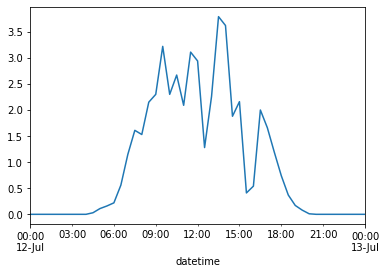

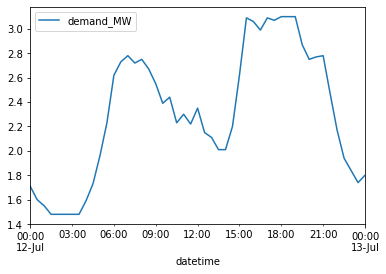

In [5]:
test_day_gen = pv_generation['pv_power_mw'].loc['2018-07-12 00:00:00':'2018-07-13 00:00:00']
test_day_dem = demand.loc['2018-07-12 00:00:00':'2018-07-13 00:00:00']

test_day_gen.plot()
test_day_dem.plot();

#### 1. Specifying Special Criterions and Building Charging Function

##### 1.1 Bateries restrictions

The batteries restrictions are the following:

- The batterie has a `max charge/discharge rate of +/- 2.5 MW`. This implies that every half hour it can load 1.25 MW, according to $C_{d, k+1}=C_{d,k} + 0.5B_{d,k}$.

- The `maximum capacity of the battery is 6MWh`. Therefore, there cannot be a state of charge larger a this one.

- The battery `starts at zero charge each day`.

- It can `charge only before 3:30pm`. After that time it can only discharge.


The aim of the charging period is to maximize the use of the energy coming from the PV modules. Therefore we'll start the days charging the battery exclusively with solar power

##### 1.2 Time-To-Charge Function

Let there be 

$T(C):= \textit{Time that would take to charge completely the battery at full speed given the current charge}.$

Note that $T(0) = 4.8\frac{hrs}{2}$ because every half hour, the battery would charge $1.25 MW$. Then every hour, we'd have $2.5MW$ when charging at full speed, and so on resulting with the $6MWh$ at the 80% from the fifth half hour (i.e. 4.8 hr/2). In hours we have that $T(0) = 2.4 hrs$.

We propose $T(C)$ so that $T(C) = \frac{6MWh - C}{2.5 MW}$.

#### 1.2 Building Function

We'll make the following considerations in order to tell the battery how to charge:

- If the PV generation $P > 2.5 MW + \delta$ at a given time, then the charging rate of the battery will be at its maximum. i.e. $B = 2.5 MW$. $\delta$ being a error margin due to the prediction. This should be optimized to guarantee that the demand will be strictly lower than the generation in order to avoid taking resources from the grid.

- If the PV generation $P =< 2.5 MW$ at a given time, then the charging rate of the battery will be $B = P - \delta$.

- If the battery is full (need to stablish a way to determine that) then $B=0$.

- If the charge of the battery is at is maximum before 3:30pm, then the battery will be in standby until the time of the dicharge (after 3:30) and more precisely, around the peak hours.


- If the battery is not fully charged by the time 1:06pm (3:30pm - 2.4hrs) then we'll evaluate the risk of keep charging the battery entirely with PV resources, because, if there is not enough generation, there would exist the posibility of not having the battery fully charged by 3:30pm therefore diminishing the afternoon peak reduction. This one is the tricky part...

In [6]:
#calculation of the integral of the demand load over the peaking period (15:30-21:00)

def offset(daily_demand_load_df, C_max, t0 = '15:30:00', t = '21:00:00'):
    t0 = datetime.strptime( t0 , '%H:%M:%S')
    t = datetime.strptime( t , '%H:%M:%S')
    
    #calculation of the integral with Riemann Sum.
    L = daily_demand_load_df.values #demand load
    I = 0
    for i in range(len(daily_demand_load_df.index)):
        time_ = daily_demand_load_df.index[i].time()
        
        if t0.time() <= time_ < t.time():
            I = I + 0.5*L[i]    #resulting value of the integral
    dt = t - t0
    dt = dt.seconds/3600
    A = (I - C_max)/dt
    return A

In [7]:
from datetime import datetime
def battery_charge_schedule(generation_df, demand_load_df):
    #defining futures of the battery
    B_max = 2.5 #[MW]
    C_max = 6.0 #[MWh]
    C_min = 0.0 #[MWh]
    #we generate arrays with the charging rate and charge info 
    C = np.zeros(generation_df.shape[0])
    B = np.zeros(generation_df.shape[0])
    A = np.zeros(generation_df.shape[0])
    #loop over the time steps (half hours)
    P = generation_df.values #PV generation
    L = demand_load_df['demand_MW'].values #demand load
    for i in range(1,len(generation_df.index)):
        date_ = demand_load_df.index[i].date()
        time_ = generation_df.index[i].time()
        #conditions for charging period.
        if datetime.strptime('04:30:00', '%H:%M:%S').time() < time_ <= datetime.strptime('15:30:00', '%H:%M:%S').time():
                
                
            if C[i-1] == C_max:
                C[i] = C_max
            elif C[i-1] + 0.5*B[i-1] <= C_max:
                C[i] = C[i-1] + 0.5*B[i-1]
            elif C[i-1] + 0.5*B[i-1] > C_max:
                if C[i-1] == C_max:
                    C[i] = C_max
                elif C[i-1] < C_max: 
                    B[i-1] = 2*(C_max - C[i-1])
                    C[i] = C[i-1] + 0.5*B[i-1]
                if C[i] > C_max:
                    C[i] = C_max      
                    
            if P[i] > B_max + 0.1:
                B[i] = B_max # + delta
            if P[i] <= B_max - 0.05:
                B[i] = P[i] # + delta
            if C[i] == C_max:
                B[i] = 0.0
            if time_ == datetime.strptime('15:30:00', '%H:%M:%S').time():
                B[i] = 0        #discharging
        
        #calculation of the offset A.
        dti = datetime.strptime(str(date_) + ' ' + str('00:00:00'), '%Y-%m-%d %H:%M:%S')
        dtf = datetime.strptime(str(date_) + ' ' + str('23:30:00'), '%Y-%m-%d %H:%M:%S')
        daily_demand_load_df = demand_load_df['demand_MW'].loc[dti:dtf]
        A[i] = offset(daily_demand_load_df, C_max = C.max())
        
        #conditional for the peak period.
        if datetime.strptime('15:30:00', '%H:%M:%S').time() <= time_ <= datetime.strptime('20:30:00', '%H:%M:%S').time():
            
            if L[i] > A[i]:
                if L[i] - A[i] > B_max:
                    B[i] = - B_max
                elif 0.0 <= L[i] - A[i] <= B_max:
                    B[i] = A[i] - L[i]
                else:
                    B[i] = 0.0
            else:
                B[i] = 0.0
                
            if C[i-1] == C_min:
                C[i] = C_min
                B[i] = 0.0
            elif C[i-1] > C_min:
                C[i] = C[i-1] + 0.5*B[i-1]
                if C[i] < C_min:
                    C[i] = C_min
            
                
            
    Charge_rate = pd.DataFrame(data = B, index = generation_df.index, columns = ['charge_MW'])
    Total_charge = pd.DataFrame(data = C, index = generation_df.index, columns = ['total_charge_MWh'])
    Offset =  pd.DataFrame(data = A, index = generation_df.index, columns = ['daily_offset'])

    return Charge_rate , Total_charge, Offset

In [8]:
Charge_rate_test, total_charge, offset_daily = battery_charge_schedule(test_day_gen, test_day_dem)
#Charge_rate_test.head()

Building special functions to reconstruct the charge rate serie as well as charge state of the battery.

In [9]:
#reconstructing
def charge_state_from_charge_rate(charge_rate_df):
    B = charge_rate_df.values    
    C = np.zeros(len(B))
    
    for i in range(1, len(B)):
        C[i] = C[i-1] + 0.5*B[i-1]
        
    charge_state = pd.DataFrame(data=C, columns=['total_charge_MWh'], index = charge_rate_df.index )
    return charge_state

def charge_rate_from_charge_state(charge_state_df):
    C = charge_state_df.values    
    B = np.zeros(len(C))
    
    for i in range(len(C)-1):
        B[i] = 2*(C[i+1] - C[i])
        
    charge_rate = pd.DataFrame(data=B, columns=['charge_MW'], index = charge_state_df.index)
    return charge_rate

Checking the max and min values to confirm the restrictions

In [10]:
charge_rate_reconstructed = charge_rate_from_charge_state(total_charge)
charge_state_reconstructed = charge_state_from_charge_rate(charge_rate_reconstructed)
charge_rate_reconstructed.values.max(), charge_state_reconstructed.values.max(), charge_rate_reconstructed.values.min(), charge_state_reconstructed.values.min()

(2.299999999999999, 6.0, -1.1918181818181814, 0.0)

In [11]:
#interactive plotting
Generation = go.Scatter(x=test_day_gen.index, y=test_day_gen.values, opacity = 1, name = 'Power Generation', line=dict(color='lightblue'), yaxis='y')
Demand = go.Scatter(x=test_day_dem.index, y=test_day_dem['demand_MW'].values, opacity = 1, name = 'Power Demand', line=dict(color='royalBlue'), yaxis='y')
Demand_p = go.Scatter(x=test_day_dem.index, y=test_day_dem['demand_MW'].values, mode='markers', opacity = 1, name = 'Power Demand', line=dict(color='lightgreen'), yaxis='y')

Charge_Profile = go.Scatter(x=Charge_rate_test.index, y=Charge_rate_test['charge_MW'].values, opacity = 1, name = 'Battery Charge Rate', line=dict(color='crimson'), yaxis='y')
Charge_Profile_p = go.Scatter(x=Charge_rate_test.index, y=Charge_rate_test['charge_MW'].values, mode = 'markers', opacity = 1, name = 'Battery Charge Rate', line=dict(color='yellow'), yaxis='y')
Charge_Profile_r = go.Scatter(x=charge_rate_reconstructed.index, y=charge_rate_reconstructed['charge_MW'].values, opacity = 1, name = 'Battery Charge Rate Reconstructed', line=dict(color='purple'), yaxis='y')

Total_charge = go.Scatter(x=total_charge.index, y=total_charge['total_charge_MWh'].values, opacity = 1, name = 'Battery Charge State', line=dict(color='magenta'), yaxis='y2')
Total_charge_r = go.Scatter(x=charge_state_reconstructed.index, y=charge_state_reconstructed['total_charge_MWh'].values, opacity = 1, name = 'Battery Charge State Reconstructed', line=dict(color='green'), yaxis='y2')

Offset = go.Scatter(x=offset_daily.index, y=offset_daily['daily_offset'].values, opacity = 1, name = 'Offset', line=dict(color='black'), yaxis='y')

t0 = datetime.strptime('2018-07-12 15:30:00', '%Y-%m-%d %H:%M:%S')
t = datetime.strptime('2018-07-12 21:00:00', '%Y-%m-%d %H:%M:%S')

layout = go.Layout(title='PV Generation / Demand', xaxis=dict(title='Datetime'),
                   yaxis=dict(title='MW Average'),
                  yaxis2=dict(title='MWh Average', side='right', overlaying='y'))
fig = go.Figure(data=[Generation, Demand, Demand_p, Charge_Profile, Charge_Profile_p, Charge_Profile_r, Total_charge, Total_charge_r, Offset], layout=layout)
fig.add_vline(x=t0)
fig.add_vline(x=t)
fig.show() # if this is rendered in colab, you should run fig.show(renderer='colab') instead.

In [12]:
Charge_rate_all, total_charge_all, offset_all = battery_charge_schedule(pv_generation['pv_power_mw'], demand)

In [13]:
charge_rate_reconstructed = charge_rate_from_charge_state(total_charge_all)
charge_state_reconstructed = charge_state_from_charge_rate(charge_rate_reconstructed)
charge_rate_reconstructed.values.max(), charge_state_reconstructed.values.max(), charge_rate_reconstructed.values.min(), charge_state_reconstructed.values.min()

(2.500000000000001, 6.0, -1.9009090909090909, 0.0)

In [14]:
Generation = go.Scatter(x=pv_generation['pv_power_mw'].index, y=pv_generation['pv_power_mw'].values, opacity = 0.7, name = 'Power Generation', line=dict(color='lightblue'), yaxis='y')
Demand = go.Scatter(x=demand.index, y=demand['demand_MW'].values, opacity = 0.7, name = 'Power Demand', line=dict(color='royalBlue'), yaxis='y')
Demand_p = go.Scatter(x=test_day_dem.index, y=test_day_dem['demand_MW'].values, mode='markers', opacity = 1, name = 'Power Demand', line=dict(color='lightgreen'), yaxis='y')

Charge_Profile = go.Scatter(x=Charge_rate_all.index, y=Charge_rate_all['charge_MW'].values, opacity = 0.7, name = 'Battery Charge Rate', line=dict(color='crimson'), yaxis='y')
Charge_Profile_p = go.Scatter(x=Charge_rate_all.index, y=Charge_rate_all['charge_MW'].values, mode = 'markers', opacity = 1, name = 'Battery Charge Rate', line=dict(color='yellow'), yaxis='y')
Charge_Profile_r = go.Scatter(x=charge_rate_reconstructed.index, y=charge_rate_reconstructed['charge_MW'].values, opacity = 1, name = 'Battery Charge Rate Reconstructed', line=dict(color='purple'), yaxis='y')

Total_charge = go.Scatter(x=total_charge_all.index, y=total_charge_all['total_charge_MWh'].values, opacity = 0.7, name = 'Battery Charge State', line=dict(color='magenta'), yaxis='y2')
Total_charge_r = go.Scatter(x=charge_state_reconstructed.index, y=charge_state_reconstructed['total_charge_MWh'].values, opacity = 1, name = 'Battery Charge State Reconstructed', line=dict(color='green'), yaxis='y2')

Offset = go.Scatter(x=offset_all.index, y=offset_all['daily_offset'].values, opacity = 1, name = 'Offset', line=dict(color='black'), yaxis='y')


layout = go.Layout(title='PV Generation / Demand', xaxis=dict(title='Datetime'),
                   yaxis=dict(title='MW Average'),
                  yaxis2=dict(title='MWh Average', side='right', overlaying='y'))
fig = go.Figure(data=[Generation, Demand, Demand_p, Charge_Profile, Charge_Profile_p, Charge_Profile_r, Total_charge, Total_charge_r, Offset], layout=layout)
fig.show() # if this is rendered in colab, you should run fig.show(renderer='colab') instead.

In [15]:
total_charge_all.values.max(), Charge_rate_all.values.max()

(6.0, 2.5)

----

In [35]:
def battery_charge_schedule_2(generation_df, demand_load_df):
    #defining futures of the battery
    B_max = 2.5 #[MW]
    C_max = 6.0 #[MWh]
    C_min = 0.0 #[MWh]
    #we generate arrays with the charging rate and charge info 
    C = np.zeros(generation_df.shape[0])
    B = np.zeros(generation_df.shape[0])
    A = np.zeros(generation_df.shape[0])
    #loop over the time steps (half hours)
    P = generation_df.values #PV generation
    L = demand_load_df['Y_predict_[MW]'].values #demand load
    for i in range(1,len(generation_df.index)):
        date_ = demand_load_df.index[i].date()
        time_ = generation_df.index[i].time()
        #conditions for charging period.
        if datetime.strptime('04:30:00', '%H:%M:%S').time() < time_ <= datetime.strptime('15:30:00', '%H:%M:%S').time():
                
                
            if C[i-1] == C_max:
                C[i] = C_max
            elif C[i-1] + 0.5*B[i-1] <= C_max:
                C[i] = C[i-1] + 0.5*B[i-1]
            elif C[i-1] + 0.5*B[i-1] > C_max:
                if C[i-1] == C_max:
                    C[i] = C_max
                elif C[i-1] < C_max: 
                    B[i-1] = 2*(C_max - C[i-1])
                    C[i] = C[i-1] + 0.5*B[i-1]
                if C[i] > C_max:
                    C[i] = C_max      
                    
            if P[i] > B_max + 0.1:
                B[i] = B_max # + delta
            if P[i] <= B_max - 0.05:
                B[i] = P[i] # + delta
            if C[i] == C_max:
                B[i] = 0.0
            if time_ == datetime.strptime('15:30:00', '%H:%M:%S').time():
                B[i] = 0        #discharging
        
        if i > 30:
            if time_ >= datetime.strptime('15:30:00', '%H:%M:%S').time():
                #calculation of the offset A.
                dti = datetime.strptime(str(date_) + ' ' + str('00:00:00'), '%Y-%m-%d %H:%M:%S')
                dtf = datetime.strptime(str(date_) + ' ' + str('23:30:00'), '%Y-%m-%d %H:%M:%S')
                daily_demand_load_df = demand_load_df['Y_predict_[MW]'].loc[dti:dtf]
                C_day = C[i-30:i]
                A[i] = offset(daily_demand_load_df, C_max = C_day.max())
            else: 
                A[i] = A[i-1]
        
        #conditional for the peak period.
        if datetime.strptime('15:30:00', '%H:%M:%S').time() <= time_ <= datetime.strptime('20:30:00', '%H:%M:%S').time():
            
            if L[i] > A[i]:
                if L[i] - A[i] > B_max:
                    B[i] = - B_max
                elif 0.0 <= L[i] - A[i] <= B_max:
                    B[i] = A[i] - L[i]
                else:
                    B[i] = 0.0
            else:
                B[i] = 0.0
                
            if C[i-1] == C_min:
                C[i] = C_min
                B[i] = 0.0
            elif C[i-1] > C_min:
                C[i] = C[i-1] + 0.5*B[i-1]
                if C[i] < C_min:
                    C[i] = C_min
            
                
            
    Charge_rate = pd.DataFrame(data = B, index = generation_df.index, columns = ['charge_MW'])
    Total_charge = pd.DataFrame(data = C, index = generation_df.index, columns = ['total_charge_MWh'])
    Offset =  pd.DataFrame(data = A, index = generation_df.index, columns = ['daily_offset'])
    return Charge_rate , Total_charge, Offset

In [36]:
predic_dem = pd.read_csv('./Forecasting/1/output_pred_demanda.csv', parse_dates = True, index_col = 'datetime')
predic_gen = pd.read_csv('./Forecasting/1/output_pred_gen.csv', parse_dates = True, index_col = 'datetime')

In [37]:
predic_dem

,Y_predict_[MW]
datetime,
2018-10-16 00:00:00,2.625313
2018-10-16 00:30:00,2.575721
2018-10-16 01:00:00,2.505156
2018-10-16 01:30:00,2.419052
2018-10-16 02:00:00,2.325565
...,...
2018-10-22 21:30:00,3.137493
2018-10-22 22:00:00,2.903647
2018-10-22 22:30:00,2.766736


In [38]:
predic_gen

,Y_predict_[MW]
datetime,
2018-10-16 00:00:00,0.0
2018-10-16 00:30:00,0.0
2018-10-16 01:00:00,0.0
2018-10-16 01:30:00,0.0
2018-10-16 02:00:00,0.0
...,...
2018-10-22 21:30:00,0.0
2018-10-22 22:00:00,0.0
2018-10-22 22:30:00,0.0


In [39]:
demanda_pred_df = demanda.iloc[-336:]
generac_pred_df = pv_generation['Y_predict_[MW]'].iloc[-336:]

In [40]:
#demanda_pred_df, generac_pred_df

In [41]:
Charge_rate_predict, total_charge_predict, offset_predict = battery_charge_schedule_2(generac_pred_df, demanda_pred_df)

In [42]:
charge_rate_reconstructed = charge_rate_from_charge_state(total_charge_predict)


In [43]:
charge_rate_reconstructed.head(50)

,charge_MW
datetime,
2018-10-16 00:00:00,0.000000
2018-10-16 00:30:00,0.000000
2018-10-16 01:00:00,0.000000
2018-10-16 01:30:00,0.000000
2018-10-16 02:00:00,0.000000
2018-10-16 02:30:00,0.000000
2018-10-16 03:00:00,0.000000
2018-10-16 03:30:00,0.000000
2018-10-16 04:00:00,0.000000


<AxesSubplot:xlabel='datetime'>

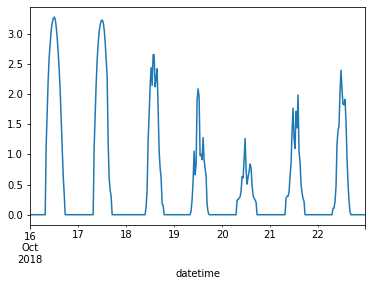

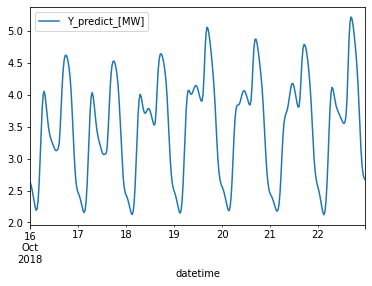

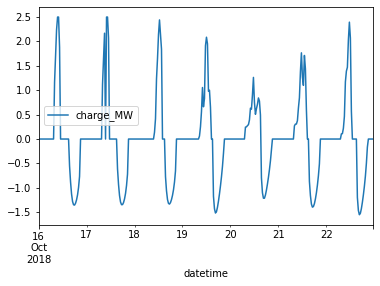

In [44]:
generac_pred_df.plot()
demanda_pred_df.plot()
Charge_rate_predict.plot()

In [45]:

Generation = go.Scatter(x=predic_gen['Y_predict_[MW]'].index, y=predic_gen['Y_predict_[MW]'].values, opacity = 0.7, name = 'Power Generation Forecast', line=dict(color='lightblue'), yaxis='y')
Demand = go.Scatter(x=predic_dem.index, y=predic_dem['Y_predict_[MW]'].values, opacity = 0.7, name = 'Forecasted Power Demand', line=dict(color='royalBlue'), yaxis='y')

Charge_Profile_r = go.Scatter(x=Charge_rate_predict.index, y=Charge_rate_predict['charge_MW'].values, opacity = 1, name = 'Battery Charge Rate', line=dict(color='purple'), yaxis='y')

Total_charge = go.Scatter(x=total_charge_predict.index, y=total_charge_predict['total_charge_MWh'].values, opacity = 0.7, name = 'Battery Charge State', line=dict(color='magenta'), yaxis='y2')

Offset = go.Scatter(x=offset_predict.index, y=offset_predict['daily_offset'].values, opacity = 1, name = 'Offset', line=dict(color='black'), yaxis='y')


layout = go.Layout(title='PV Generation / Demand', xaxis=dict(title='Datetime'),
                   yaxis=dict(title='MW Average'),
                  yaxis2=dict(title='MWh Average', side='right', overlaying='y'))
fig = go.Figure(data=[Generation, Demand, Charge_Profile_r, Total_charge, Offset], layout=layout)
fig.show() # if this is rendered in colab, you should run fig.show(renderer='colab') instead.

In [27]:
Charge_rate_predict.to_csv('./IERFC_set1.csv')


----

<AxesSubplot:xlabel='datetime'>

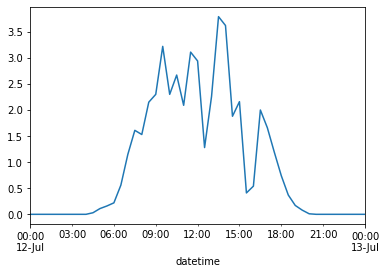

In [47]:
test_day_gen.plot()

In [112]:
def adjust_normal_generation(daily_generation_df, tx = '15:00:00'):
    
    tx = datetime.strptime( tx , '%H:%M:%S')
    ta, tb = get_start_end_time_generation(daily_generation_df)
    # time in hours array
    t = np.arange(0, 24, 0.5)
    dt = ta - tb
    dt = dt.seconds/3600
    f = np.exp((-9/2)*((t-12)/dt)**2)*1.01619537
    t_df = pd.DataFrame(data=f, columns = ['Normal'], index = daily_generation_df.index)
    #calculation of the integral with Riemann Sum.
    N = t_df.values
    I = 0
    for i in range(len(t_df.index)):
        time_ = t_df.index[i].time()
        
        if ta.time() <= time_ < tx.time():
            I = I + 0.5*N[i]    #resulting value of the integral
            #print(I)
    return t_df

In [113]:
N = adjust_normal_generation(test_day_gen.iloc[:-1], tx = '15:00:00')


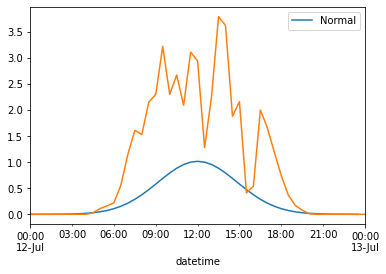

In [114]:
N.plot()
test_day_gen.plot();

In [56]:
def get_start_end_time_generation(test_day_gen):
    for i in range(3, len(test_day_gen) - 3):
        if test_day_gen.values[i] > 0:
            if test_day_gen.values[i-1] == 0 and test_day_gen.values[i-2] == 0 and test_day_gen.values[i-3] == 0:
                ta = test_day_gen.index[i]
            if test_day_gen.values[i+1] == 0 and test_day_gen.values[i+2] == 0 and test_day_gen.values[i+3] == 0:
                tb = test_day_gen.index[i]
    return ta, tb


In [125]:
def adjust_probability_generation(daily_generation_df, tx = '15:00:00'):
    
    tx = datetime.strptime( tx , '%H:%M:%S')
    ta, tb = get_start_end_time_generation(daily_generation_df)

    #t_df = pd.DataFrame(data=f, columns = ['Normal'], index = daily_generation_df.index)
    #calculation of the integral with Riemann Sum.
    P = daily_generation_df.values
    I = 0
    for i in range(len(daily_generation_df.index)):
        time_ = daily_generation_df.index[i].time()
        
        if ta.time() <= time_ < tx.time():
            I = I + 0.5*P[i]    #resulting value of the integral
            #print(I)
    B = 6/I
    P_df = pd.DataFrame(data=B*P, columns = ['Probability'], index = daily_generation_df.index)
    return P_df

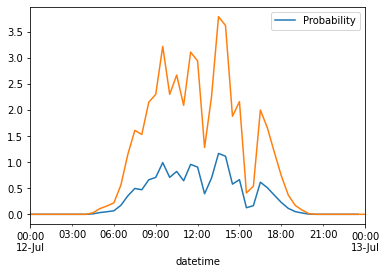

In [126]:
B, P = adjust_probability_generation(test_day_gen.iloc[:-1], tx = '15:00:00')
P.plot()
test_day_gen.plot();